# Experiments with the diversity condition violated

In this notebook I will perform the SimCLR experiments where the diversity condition was violated. Mathematically it essentially means that we will use the following distributions for sampling:

- $p(z) = \frac{1}{|\mathcal{Z}|}$ - Marginal distribution is simply a uniform distribution on a sphere
- $p(\tilde{z}|z) = \delta(u-u') \frac{e^{\kappa \tilde{z}^{T}z}}{\int_{W}e^{\kappa v^{T}v' dv}}$

Where the latent space can be decomposed into 2 components $z = (u,v)^{T}$ where $u \in R^{n}$, $v \in R^{m}$, and $m + n = d$ - the dimension of the latent space.

I will primarily work with hyper-spheres as my latent space, hence the condition $z^{2} = u^{2} + v^{2} = 1$ will be enforced.

Experiment with these data-generating processes:

- Identity ✅
- Linear Mapping (to 4D, 5D, 6D, 7D) ✅
- Spirals ✅
- Patches ✅
- Injective Neural Network as a data generating process ✅

For now fix one dimension (the first one):

Consider later:

- Fix multiple dimensions
- Fix dimensions randomly


Additionally, we want to take an orthogonal transformation and check that the loss in our sampling experiment is higher than the loss we have achieved by directly optimizing the neural network $f$

In [9]:
%load_ext autoreload
%autoreload 2

import sys
import os
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), '..'))

import torch
from torch import nn
from torch import functional
from simclr.simclr import SimCLR
from encoders import get_mlp
import matplotlib.pyplot as plt
from spaces import NSphereSpace
from visualization_utils.spheres import visualize_spheres_side_by_side

from experiment_utils.simclr_executor import SimCLRExecutor


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

batch_size = 2000
tau = 0.3
kappa = 1 / tau
iterations = 10000
latent_dim = 3

fixed_dims_on_sample = 1

full_sphere = NSphereSpace(3)
sub_sphere = NSphereSpace(2)


def sample_conditional_with_dims_fixed(z, batch, u_dim):
    u = z[:,:u_dim]
    v = z[:,u_dim:]

    v_norm = torch.nn.functional.normalize(v, dim=-1, p=2)
    aug_samples_v = sub_sphere.von_mises_fisher(v_norm, kappa, batch) * torch.norm(v, p=2, dim=-1, keepdim=True)

    return torch.cat((u, aug_samples_v), dim=-1)


def sample_pair_with_fixed_dimension(batch, u_dim):
    z = full_sphere.uniform(batch) # (N, 3)
    
    return z, sample_conditional_with_dims_fixed(z, batch, u_dim)

sample_uniform_fixed = lambda batch: full_sphere.uniform(batch)
sample_pair_fixed = lambda batch: sample_pair_with_fixed_dimension(batch, fixed_dims_on_sample)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Visualizing the constrained sampling procedure

Below you can see how samples from the constrained sampling distribution look like

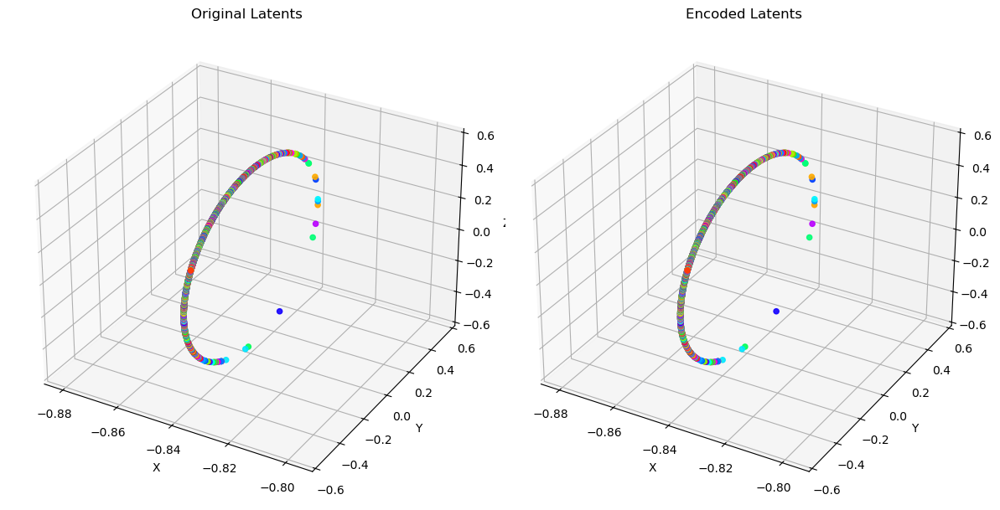

In [6]:
z = sample_uniform_fixed(1).squeeze(0)

u = z[:1]
v = z[1:]

v_norm = torch.nn.functional.normalize(v, dim=-1, p=2)
aug_samples_v = sub_sphere.von_mises_fisher(v_norm, kappa, batch_size) * torch.norm(v, p=2, dim=-1, keepdim=True)

z_aug = torch.cat((u.expand(batch_size, 1), aug_samples_v), dim=-1)

visualize_spheres_side_by_side(plt, z_aug, z_aug)

## Training the identity generating process

$g(z) = z$

Linear control score: 1.0
Permutation control score: 1.0
Loss: 6.685272216796875 Pos Loss: -2.9184865951538086 Neg Loss: 9.603758811950684 Samples processed: 1 linear disentanglement: 0.8092555999755859 permutation disentanglement: 0.6381857941405817 angle_preservation_error: 0.24424539506435394
Loss: 6.673932075500488 Pos Loss: -2.9053537845611572 Neg Loss: 9.579285621643066 Samples processed: 21 linear disentanglement: 0.8160700798034668 permutation disentanglement: 0.640086254683815 angle_preservation_error: 0.23867669701576233
Loss: 6.670649528503418 Pos Loss: -2.9121193885803223 Neg Loss: 9.582769393920898 Samples processed: 41 linear disentanglement: 0.8129436373710632 permutation disentanglement: 0.6409032004095011 angle_preservation_error: 0.24366983771324158
Loss: 6.636209011077881 Pos Loss: -2.9660532474517822 Neg Loss: 9.602262496948242 Samples processed: 61 linear disentanglement: 0.8151906132698059 permutation disentanglement: 0.6384292998259303 angle_preservation_error: 0

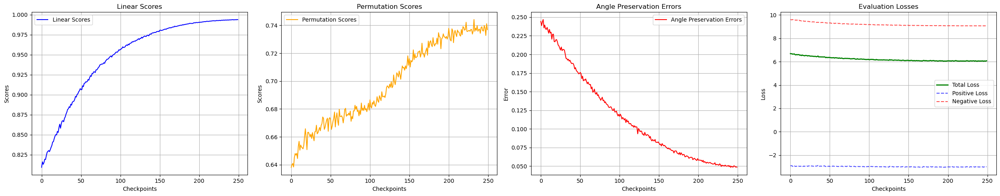

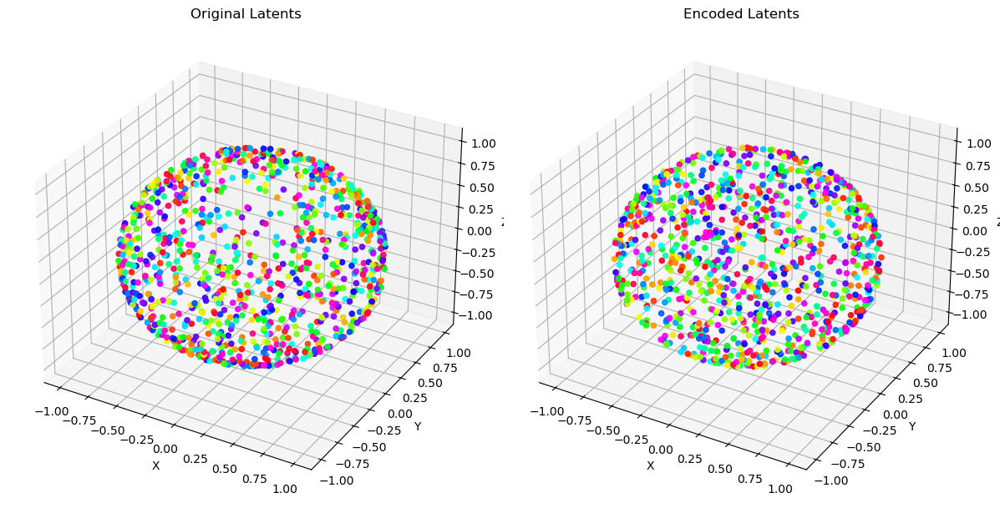

Orthogonal transformation loss:  6.074578285217285
Training loss:  6.072779655456543


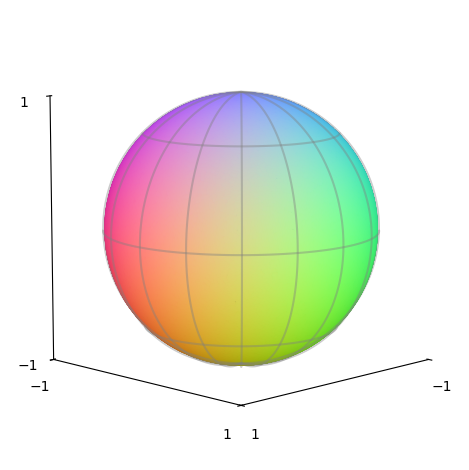

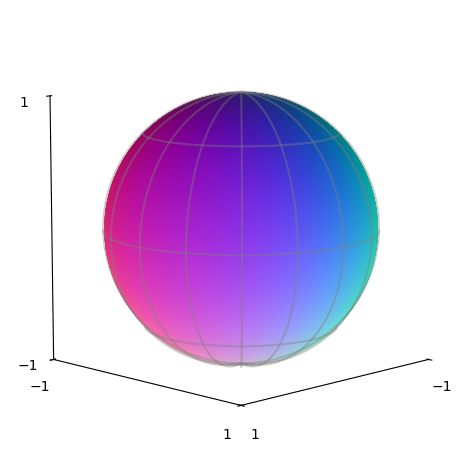

In [7]:
from encoders import LinearEncoder

g_id = nn.Identity()

f, scores = SimCLRExecutor(
    LinearEncoder(3, 3), g_id, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)


Linear control score: 1.0
Permutation control score: 1.0
Loss: 6.850949764251709 Pos Loss: -2.2435617446899414 Neg Loss: 9.094511032104492 Samples processed: 1 linear disentanglement: 0.3061862885951996 permutation disentanglement: 0.4416775910434321 angle_preservation_error: 0.26845064759254456
Loss: 6.113071441650391 Pos Loss: -2.9766459465026855 Neg Loss: 9.089716911315918 Samples processed: 21 linear disentanglement: 0.5706527829170227 permutation disentanglement: 0.5830755270922395 angle_preservation_error: 0.20273414254188538
Loss: 5.973784446716309 Pos Loss: -3.1207847595214844 Neg Loss: 9.094569206237793 Samples processed: 41 linear disentanglement: 0.5502623915672302 permutation disentanglement: 0.6138132195361329 angle_preservation_error: 0.21896328032016754
Loss: 5.927609443664551 Pos Loss: -3.15484881401062 Neg Loss: 9.08245849609375 Samples processed: 61 linear disentanglement: 0.5202722549438477 permutation disentanglement: 0.5823315745109917 angle_preservation_error: 0.2

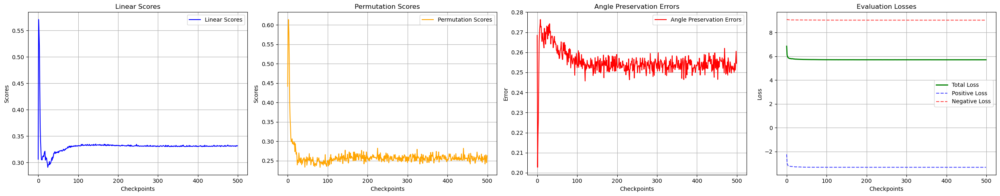

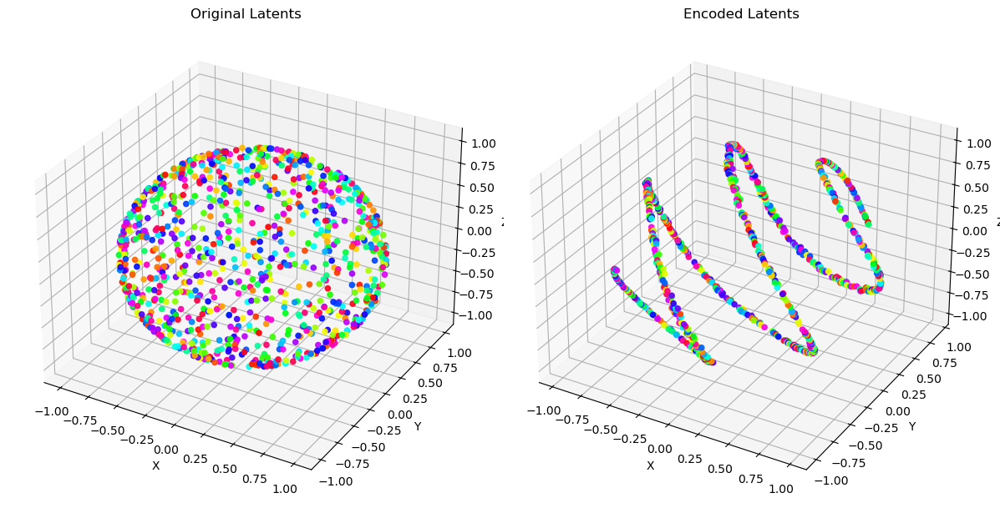

Orthogonal transformation loss:  6.063071250915527
Training loss:  5.708348274230957


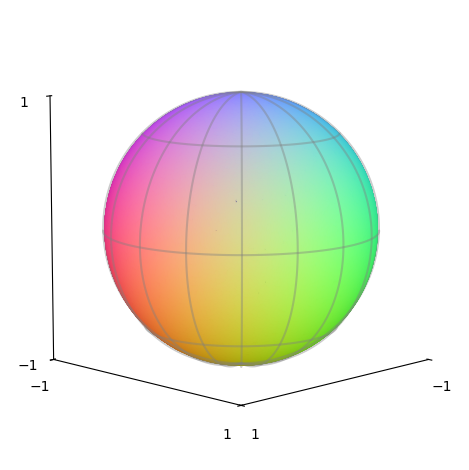

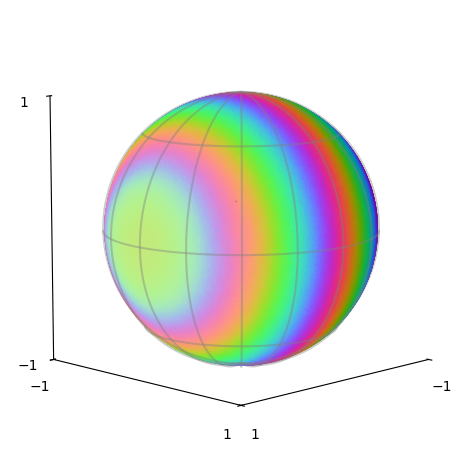

In [13]:
from encoders import SphericalEncoder

f, scores = SimCLRExecutor(
    SphericalEncoder(input_dim=3, output_dim=3), g_id, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Linear map generating process

$g(z) = Az$, where $A \in \mathbb{R}^{k \times 3}$ and $k \in \{4,5,6,7\}$ and $rank(A) = 3$

Linear control score: 1.0
Permutation control score: 1.0
Loss: 6.6911940574646 Pos Loss: -3.1184239387512207 Neg Loss: 9.80961799621582 Samples processed: 1 linear disentanglement: 0.6870515942573547 permutation disentanglement: 0.6982198049483466 angle_preservation_error: 0.24619053304195404
Loss: 6.694749355316162 Pos Loss: -3.0997419357299805 Neg Loss: 9.794490814208984 Samples processed: 21 linear disentanglement: 0.6929534077644348 permutation disentanglement: 0.7018814153266272 angle_preservation_error: 0.23937705159187317
Loss: 6.676083087921143 Pos Loss: -3.1007237434387207 Neg Loss: 9.776806831359863 Samples processed: 41 linear disentanglement: 0.6994602084159851 permutation disentanglement: 0.7082881491869645 angle_preservation_error: 0.23102572560310364
Loss: 6.673567771911621 Pos Loss: -3.094594717025757 Neg Loss: 9.768162727355957 Samples processed: 61 linear disentanglement: 0.7071349620819092 permutation disentanglement: 0.7156017476295804 angle_preservation_error: 0.23

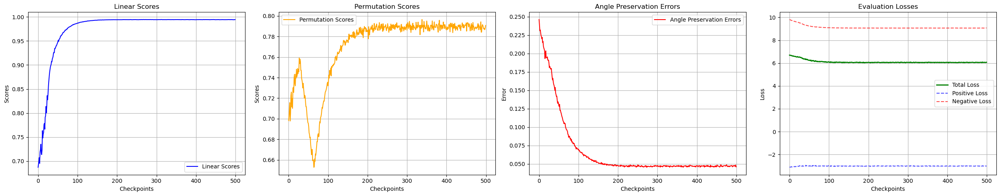

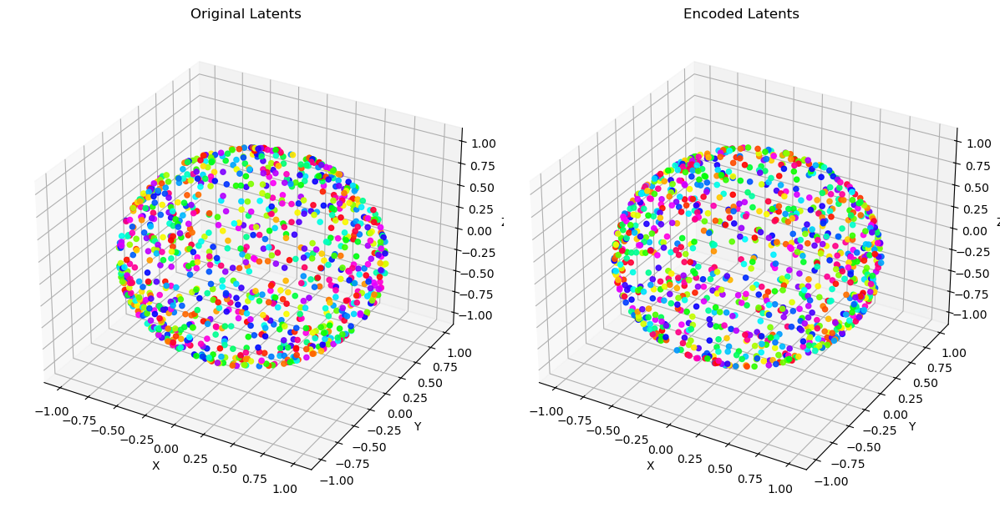

Orthogonal transformation loss:  6.075965881347656
Training loss:  6.068659782409668


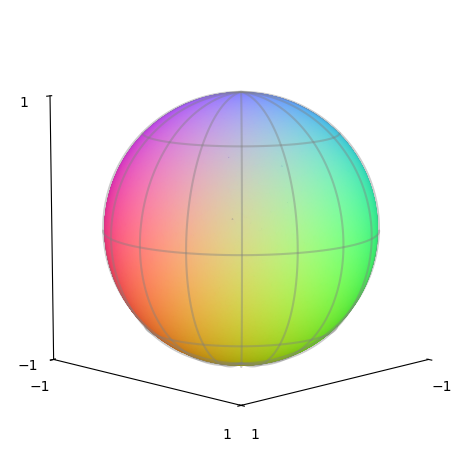

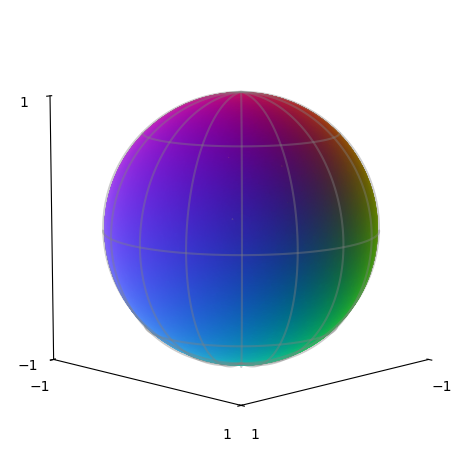

In [14]:
from data.generation import InjectiveLinearDecoder

f, scores = SimCLRExecutor(
    LinearEncoder(4, 3), InjectiveLinearDecoder(3, 4), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

Linear control score: 1.0
Permutation control score: 0.9999999999999999
Loss: 6.55634069442749 Pos Loss: -2.6055185794830322 Neg Loss: 9.161859512329102 Samples processed: 1 linear disentanglement: 0.5647450685501099 permutation disentanglement: 0.5762418122968906 angle_preservation_error: 0.2004421502351761
Loss: 6.082004547119141 Pos Loss: -2.9932165145874023 Neg Loss: 9.075221061706543 Samples processed: 21 linear disentanglement: 0.9061481952667236 permutation disentanglement: 0.763859318320539 angle_preservation_error: 0.10515083372592926
Loss: 6.081562519073486 Pos Loss: -2.984954833984375 Neg Loss: 9.066516876220703 Samples processed: 41 linear disentanglement: 0.9296168684959412 permutation disentanglement: 0.7699783605566504 angle_preservation_error: 0.09056346863508224
Loss: 6.058483600616455 Pos Loss: -3.010127305984497 Neg Loss: 9.068611145019531 Samples processed: 61 linear disentanglement: 0.9316246509552002 permutation disentanglement: 0.7722368536161444 angle_preservati

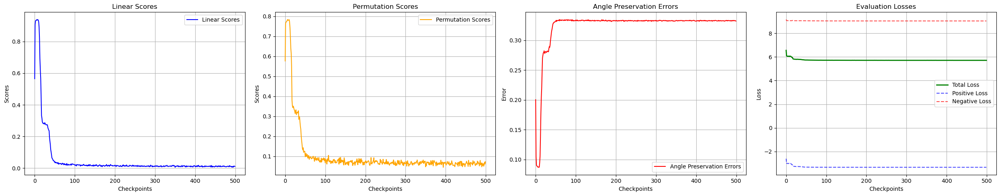

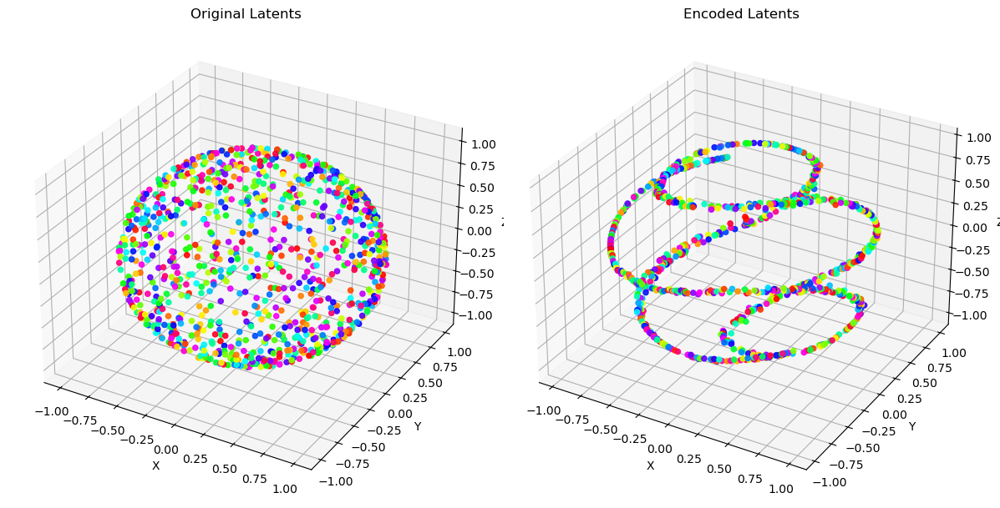

Orthogonal transformation loss:  6.0680317878723145
Training loss:  5.7102742195129395


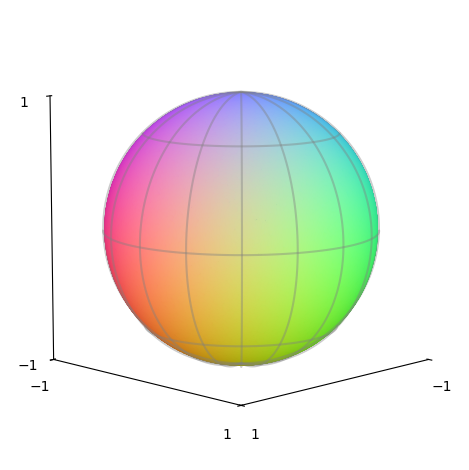

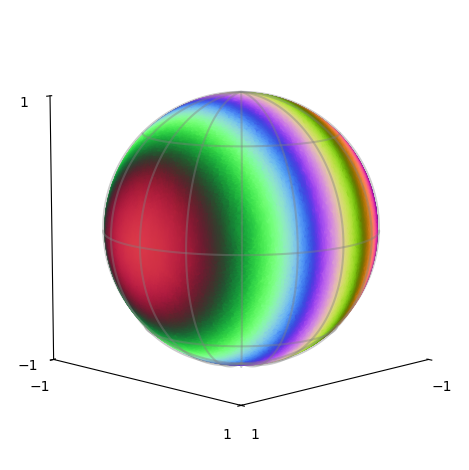

In [15]:
from encoders import SphericalEncoder

f, scores = SimCLRExecutor(
    SphericalEncoder(input_dim=4, output_dim=3), InjectiveLinearDecoder(3, 4), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)


Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.973092555999756 Samples processed: 1 linear disentanglement: 0.6621156334877014 permutation disentanglement: 0.1001976728439331 angle_preservation_error: 0.26104047894477844
Loss: 7.964780330657959 Samples processed: 21 linear disentanglement: 0.6675651669502258 permutation disentanglement: 0.10602843761444092 angle_preservation_error: 0.2573779225349426
Loss: 7.93428373336792 Samples processed: 41 linear disentanglement: 0.6742027401924133 permutation disentanglement: 0.10252394527196884 angle_preservation_error: 0.2497878074645996
Loss: 7.949604034423828 Samples processed: 61 linear disentanglement: 0.6694515347480774 permutation disentanglement: 0.10723390430212021 angle_preservation_error: 0.24877142906188965
Loss: 7.944126129150391 Samples processed: 81 linear disentanglement: 0.6798932552337646 permutation disentanglement: 0.10953905433416367 angle_preservation_error: 0.2490270435810089
Loss: 7.926958084106445 Sampl

Loss: 7.749716758728027 Samples processed: 441 linear disentanglement: 0.8025786876678467 permutation disentanglement: 0.12447712570428848 angle_preservation_error: 0.20056606829166412
Loss: 7.750038146972656 Samples processed: 461 linear disentanglement: 0.8236465454101562 permutation disentanglement: 0.12740100920200348 angle_preservation_error: 0.200898215174675
Loss: 7.73335599899292 Samples processed: 481 linear disentanglement: 0.817923367023468 permutation disentanglement: 0.12404531240463257 angle_preservation_error: 0.19807952642440796
Loss: 7.7196478843688965 Samples processed: 501 linear disentanglement: 0.8361760973930359 permutation disentanglement: 0.120572030544281 angle_preservation_error: 0.19442060589790344
Loss: 7.707082271575928 Samples processed: 521 linear disentanglement: 0.8502072691917419 permutation disentanglement: 0.12396720796823502 angle_preservation_error: 0.19110740721225739
Loss: 7.712846279144287 Samples processed: 541 linear disentanglement: 0.8471937

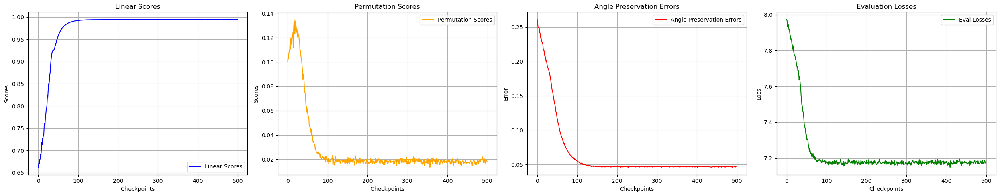

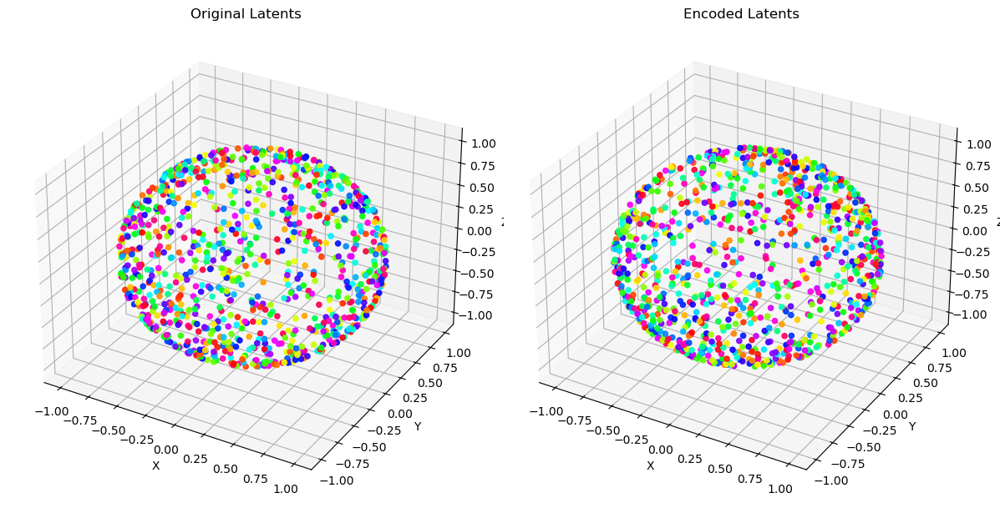

Orhtogonal loss: 7.193963050842285
Training loss 7.184426784515381


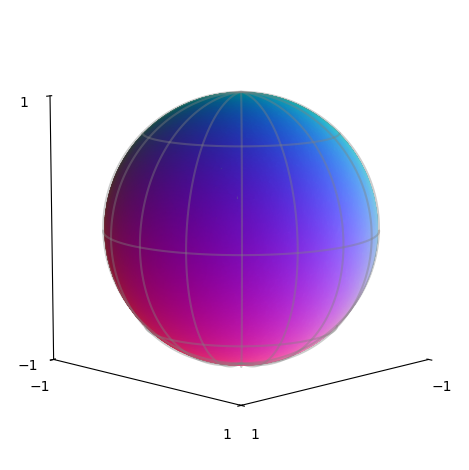

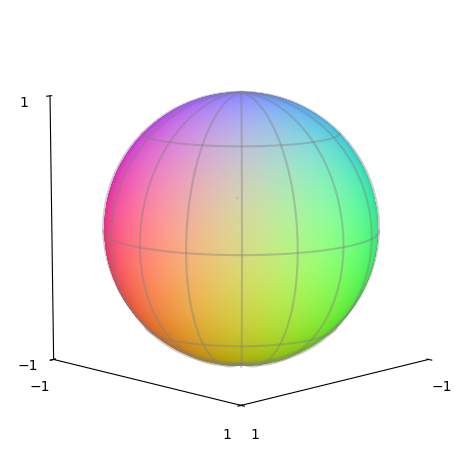

In [33]:
f, scores = SimCLRExecutor(
    LinearEncoder(5, 3), InjectiveLinearDecoder(3, 5), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)


Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.780572891235352 Samples processed: 1 linear disentanglement: 0.8630048632621765 permutation disentanglement: 0.38616445660591125 angle_preservation_error: 0.20663435757160187
Loss: 7.756803035736084 Samples processed: 21 linear disentanglement: 0.869548499584198 permutation disentanglement: 0.3955751955509186 angle_preservation_error: 0.20406675338745117
Loss: 7.750967025756836 Samples processed: 41 linear disentanglement: 0.8705838322639465 permutation disentanglement: 0.3879890441894531 angle_preservation_error: 0.204375222325325
Loss: 7.734185218811035 Samples processed: 61 linear disentanglement: 0.8729127049446106 permutation disentanglement: 0.38697633147239685 angle_preservation_error: 0.20100967586040497
Loss: 7.730838298797607 Samples processed: 81 linear disentanglement: 0.8739182353019714 permutation disentanglement: 0.40093159675598145 angle_preservation_error: 0.19730804860591888
Loss: 7.7101054191589355 Samp

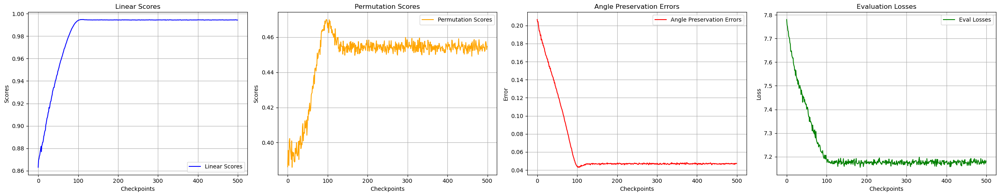

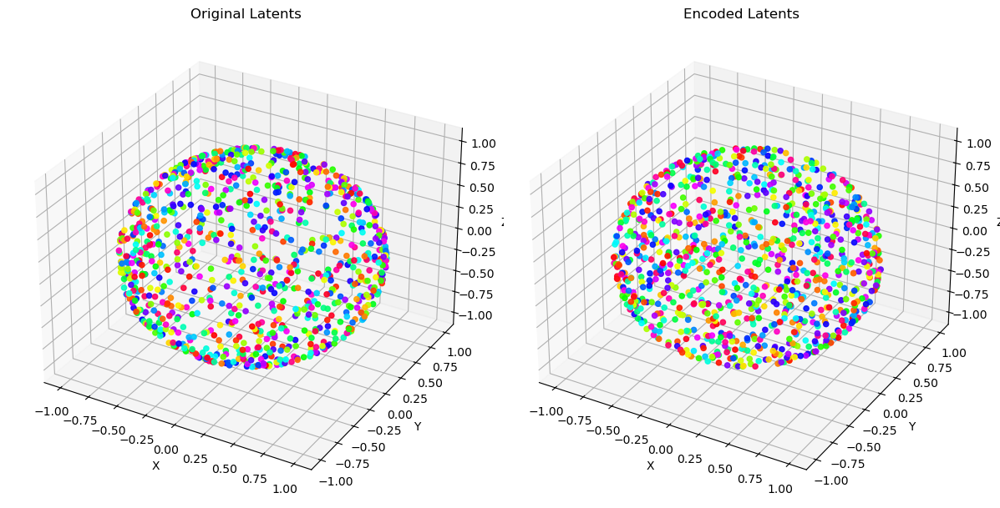

In [27]:
f, scores = SimCLRExecutor(
    SphericalEncoder(5, 3), InjectiveLinearDecoder(3, 5), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.775391578674316 Samples processed: 1 linear disentanglement: 0.8759605884552002 permutation disentanglement: 0.33555737137794495 angle_preservation_error: 0.20421142876148224
Loss: 7.752501487731934 Samples processed: 21 linear disentanglement: 0.8789463639259338 permutation disentanglement: 0.3341192901134491 angle_preservation_error: 0.20038843154907227
Loss: 7.749597072601318 Samples processed: 41 linear disentanglement: 0.8828509449958801 permutation disentanglement: 0.34809064865112305 angle_preservation_error: 0.19428043067455292
Loss: 7.738109111785889 Samples processed: 61 linear disentanglement: 0.8892216682434082 permutation disentanglement: 0.3388789892196655 angle_preservation_error: 0.19558650255203247
Loss: 7.718062400817871 Samples processed: 81 linear disentanglement: 0.8903719782829285 permutation disentanglement: 0.3576008081436157 angle_preservation_error: 0.19124668836593628
Loss: 7.720815181732178 Sam

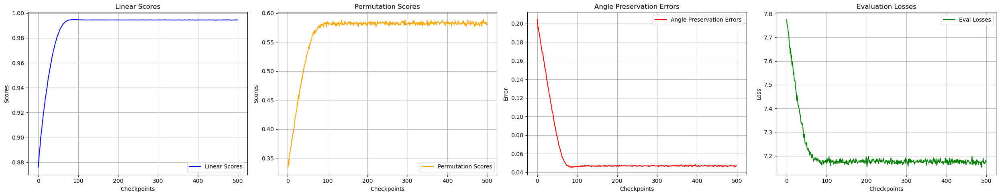

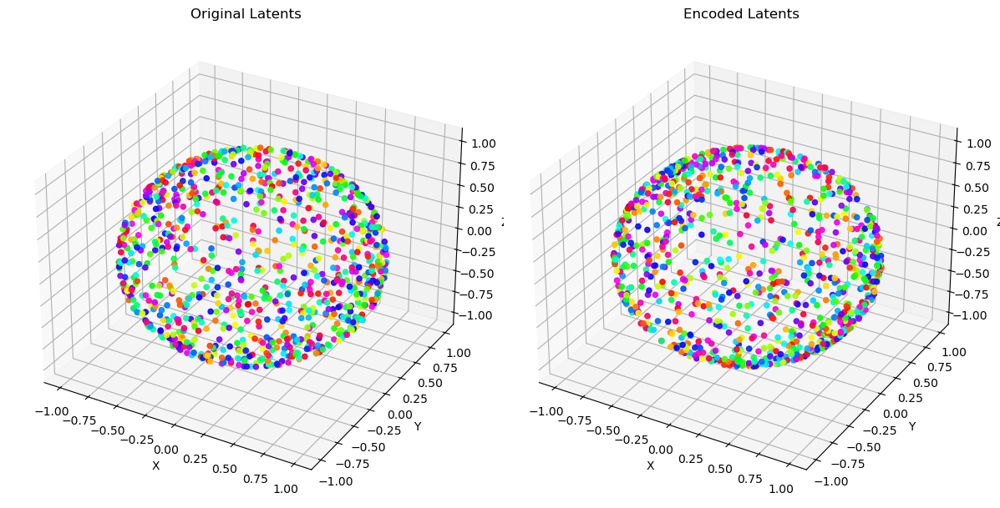

Orhtogonal loss: 7.196061134338379
Training loss 7.178399562835693


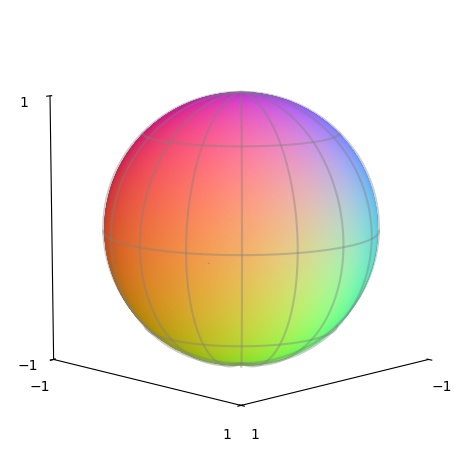

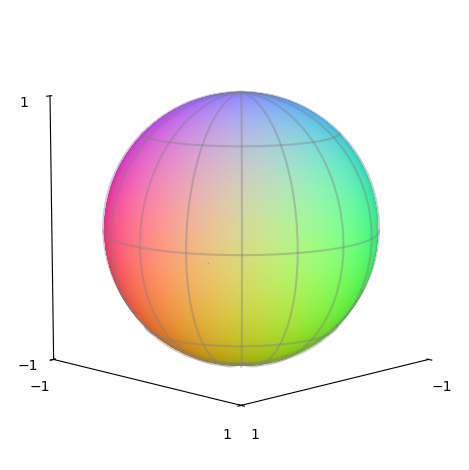

In [38]:
f, scores = SimCLRExecutor(
    LinearEncoder(6, 3), InjectiveLinearDecoder(3, 6), sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Spiral generating process

Linear control score: 1.0
Permutation control score: 1.0
Loss: 8.009584426879883 Pos Loss: -1.0632588863372803 Neg Loss: 9.072844505310059 Samples processed: 1 linear disentanglement: 0.12352492660284042 permutation disentanglement: 0.23352357339718308 angle_preservation_error: 0.30805695056915283
Loss: 6.414470195770264 Pos Loss: -2.6764748096466064 Neg Loss: 9.09094524383545 Samples processed: 21 linear disentanglement: 0.6416148543357849 permutation disentanglement: 0.5728076371250793 angle_preservation_error: 0.18171672523021698
Loss: 6.151046276092529 Pos Loss: -2.9289016723632812 Neg Loss: 9.079947471618652 Samples processed: 41 linear disentanglement: 0.8762521743774414 permutation disentanglement: 0.6438555859437575 angle_preservation_error: 0.11232084035873413
Loss: 6.084571838378906 Pos Loss: -2.9780397415161133 Neg Loss: 9.06261157989502 Samples processed: 61 linear disentanglement: 0.9265543818473816 permutation disentanglement: 0.6871008840084961 angle_preservation_error: 

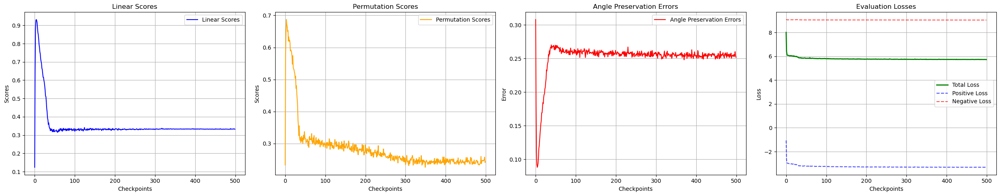

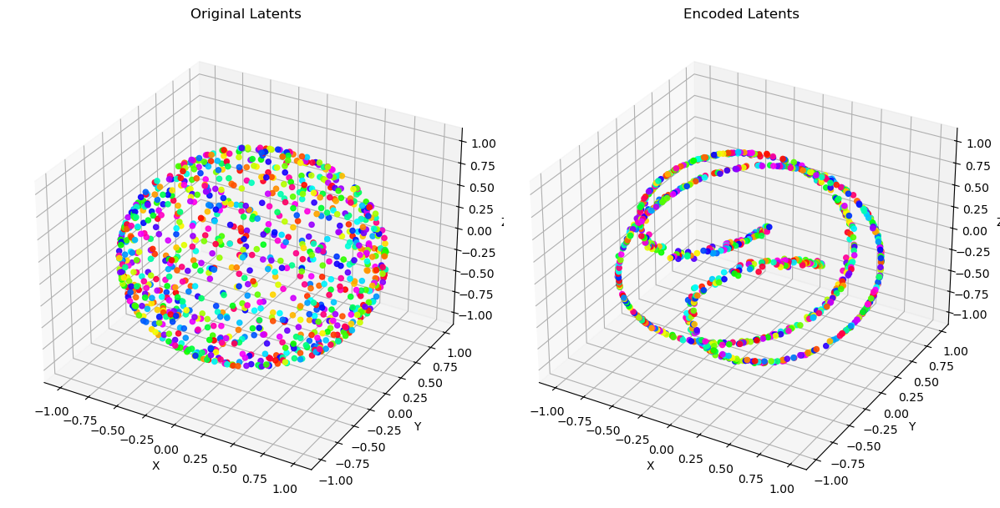

Orthogonal transformation loss:  6.063041687011719
Training loss:  5.728769779205322


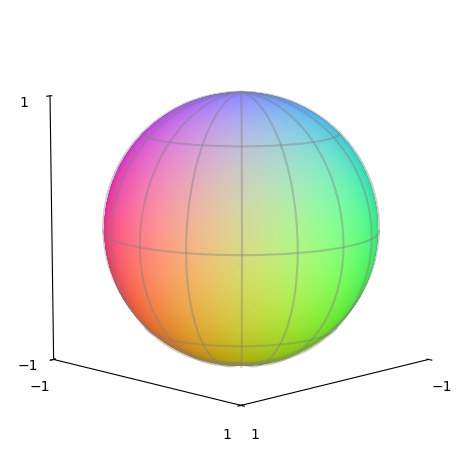

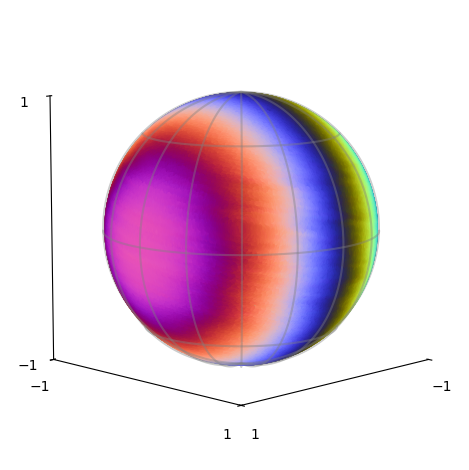

In [16]:
# from visualization_utils.scoring import plot_scores
from visualization_utils.spheres import scatter3d_sphere

from data.generation import SpiralRotation
from encoders import SphericalEncoder

f_spiral = SphericalEncoder(input_dim=3, hidden_dims=[128, 256, 256, 256, 256, 256, 256, 128], output_dim=3)

g_spiral = SpiralRotation(2)

f, scores = SimCLRExecutor(
    f_spiral, g_spiral, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Spiral Generating Process with biased Encoder

Linear control score: 1.0
Permutation control score: 0.9999999999999999
Loss: 8.389954566955566 Pos Loss: -1.0831291675567627 Neg Loss: 9.47308349609375 Samples processed: 1 linear disentanglement: 0.06055118516087532 permutation disentanglement: 0.14990212960040158 angle_preservation_error: 0.36636099219322205
Loss: 8.342804908752441 Pos Loss: -1.1320509910583496 Neg Loss: 9.47485637664795 Samples processed: 21 linear disentanglement: 0.019897660240530968 permutation disentanglement: 0.10111992662668416 angle_preservation_error: 0.36045870184898376
Loss: 8.31436538696289 Pos Loss: -1.196845293045044 Neg Loss: 9.511210441589355 Samples processed: 41 linear disentanglement: 0.003978570457547903 permutation disentanglement: 0.0481701562093298 angle_preservation_error: 0.3568445146083832
Loss: 8.135758399963379 Pos Loss: -1.408666729927063 Neg Loss: 9.544425010681152 Samples processed: 61 linear disentanglement: 0.01220210362225771 permutation disentanglement: 0.08848977795738405 angle_pr

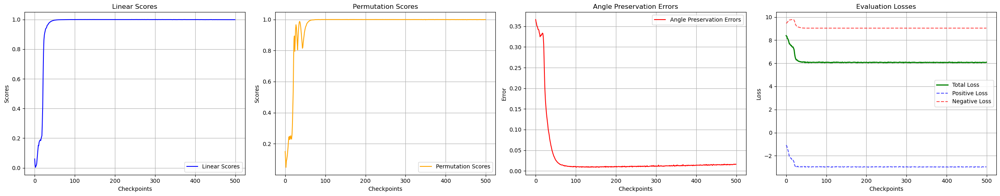

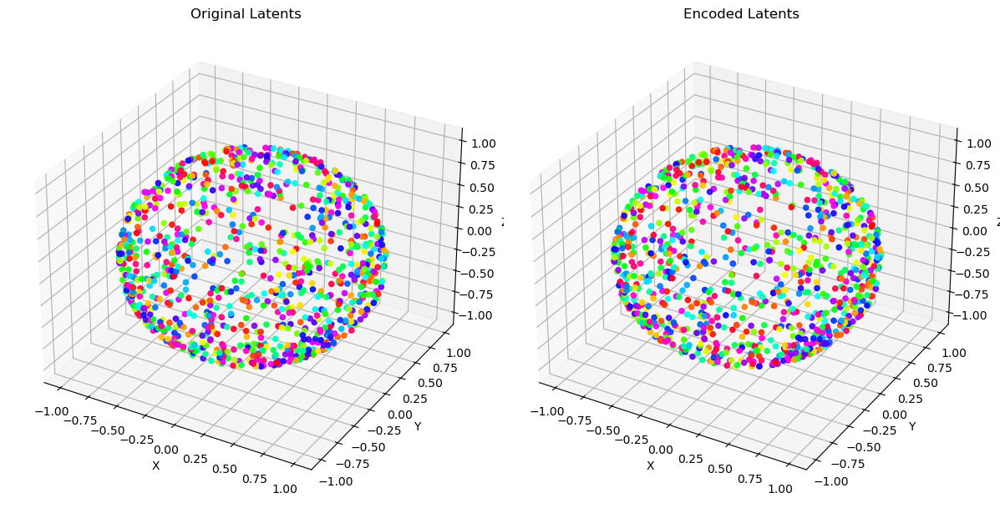

Orthogonal transformation loss:  6.060502052307129
Training loss:  6.089327812194824


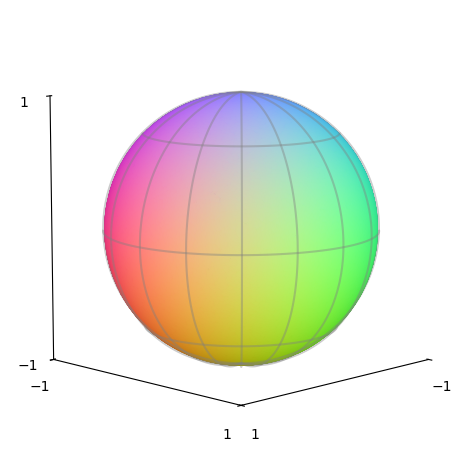

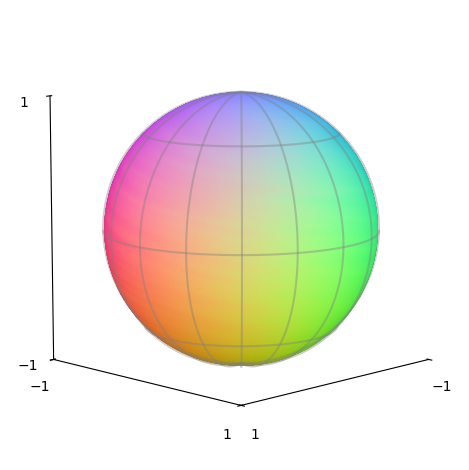

In [17]:
from encoders import InverseSpiralEncoder

f_spiral = InverseSpiralEncoder(3, 3, 2)

f, scores = SimCLRExecutor(
    f_spiral, g_spiral, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Patched generating process

Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.061476707458496 Pos Loss: -2.125441789627075 Neg Loss: 9.186918258666992 Samples processed: 1 linear disentanglement: 0.46759799122810364 permutation disentanglement: 0.5798351903357162 angle_preservation_error: 0.2437317967414856
Loss: 6.2963385581970215 Pos Loss: -2.7578556537628174 Neg Loss: 9.054194450378418 Samples processed: 21 linear disentanglement: 0.8397063612937927 permutation disentanglement: 0.8886563398379902 angle_preservation_error: 0.12274422496557236
Loss: 6.232032775878906 Pos Loss: -2.8324432373046875 Neg Loss: 9.064475059509277 Samples processed: 41 linear disentanglement: 0.8884441256523132 permutation disentanglement: 0.9221076809644423 angle_preservation_error: 0.10719326138496399
Loss: 6.198307037353516 Pos Loss: -2.864954710006714 Neg Loss: 9.063261985778809 Samples processed: 61 linear disentanglement: 0.9111797213554382 permutation disentanglement: 0.9346173211535341 angle_preservation_error: 0

Loss: 6.141927242279053 Pos Loss: -2.918210983276367 Neg Loss: 9.060137748718262 Samples processed: 361 linear disentanglement: 0.9041799902915955 permutation disentanglement: 0.9322693980171662 angle_preservation_error: 0.09587506949901581
Loss: 6.104528427124023 Pos Loss: -2.9498085975646973 Neg Loss: 9.054337501525879 Samples processed: 381 linear disentanglement: 0.8944168090820312 permutation disentanglement: 0.925859442524326 angle_preservation_error: 0.10099391639232635
Loss: 6.142624855041504 Pos Loss: -2.9171204566955566 Neg Loss: 9.059745788574219 Samples processed: 401 linear disentanglement: 0.890677273273468 permutation disentanglement: 0.9221850680214568 angle_preservation_error: 0.1066708192229271
Loss: 6.128478050231934 Pos Loss: -2.930783271789551 Neg Loss: 9.059261322021484 Samples processed: 421 linear disentanglement: 0.889385461807251 permutation disentanglement: 0.9214026057207819 angle_preservation_error: 0.10401095449924469
Loss: 6.112061023712158 Pos Loss: -2.9

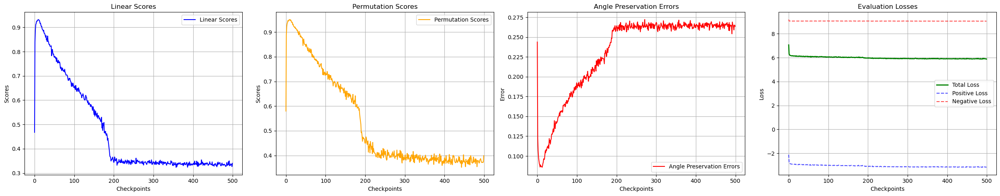

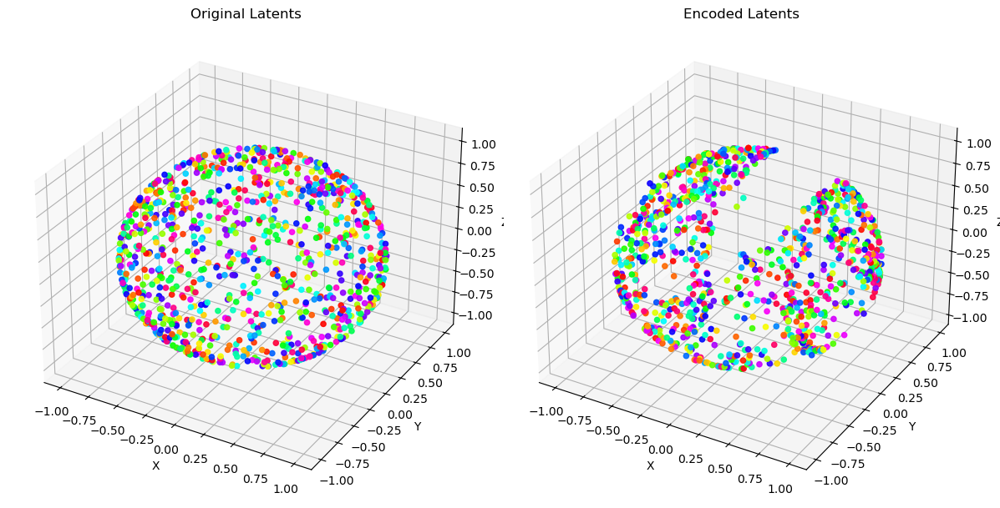

Orthogonal transformation loss:  6.064007759094238
Training loss:  5.878401756286621


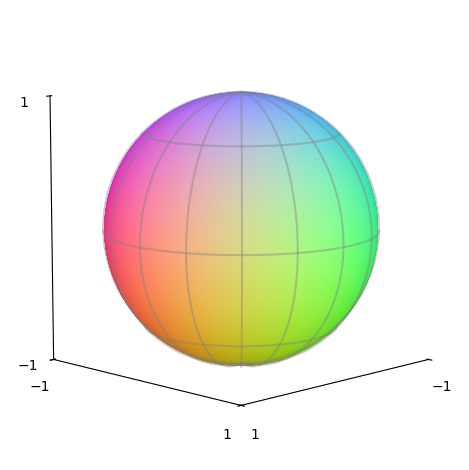

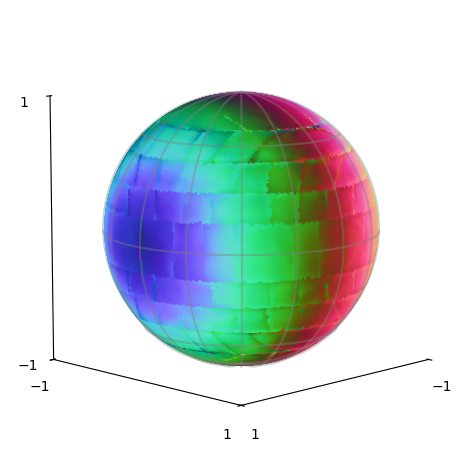

In [18]:
from data.generation import Patches
from encoders import SphericalEncoder

g_patches = Patches(5, device)
f_patches = SphericalEncoder(input_dim=3, hidden_dims=[128, 256, 128], output_dim=3)

f_patches, scores = SimCLRExecutor(
    f_patches, g_patches, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

Linear control score: 1.0
Permutation control score: 1.0
Loss: 7.113547325134277 Pos Loss: -2.383201837539673 Neg Loss: 9.496748924255371 Samples processed: 1 linear disentanglement: 0.3994927406311035 permutation disentanglement: 0.4914924758759239 angle_preservation_error: 0.26440486311912537
Loss: 7.067812442779541 Pos Loss: -2.4384496212005615 Neg Loss: 9.506261825561523 Samples processed: 21 linear disentanglement: 0.4052243232727051 permutation disentanglement: 0.47601059283909003 angle_preservation_error: 0.25688832998275757
Loss: 7.053380012512207 Pos Loss: -2.4704551696777344 Neg Loss: 9.523835182189941 Samples processed: 41 linear disentanglement: 0.3875308036804199 permutation disentanglement: 0.45521485938703005 angle_preservation_error: 0.26051682233810425
Loss: 7.049169540405273 Pos Loss: -2.493441104888916 Neg Loss: 9.542610168457031 Samples processed: 61 linear disentanglement: 0.39289364218711853 permutation disentanglement: 0.46961482023860573 angle_preservation_error

Loss: 6.954223155975342 Pos Loss: -2.6787900924682617 Neg Loss: 9.633011817932129 Samples processed: 161 linear disentanglement: 0.41108083724975586 permutation disentanglement: 0.48113896206749995 angle_preservation_error: 0.25252071022987366
Loss: 6.95525598526001 Pos Loss: -2.678802013397217 Neg Loss: 9.634057998657227 Samples processed: 181 linear disentanglement: 0.43229973316192627 permutation disentanglement: 0.4803164655606123 angle_preservation_error: 0.24860408902168274
Loss: 6.97939395904541 Pos Loss: -2.6664483547210693 Neg Loss: 9.645842552185059 Samples processed: 201 linear disentanglement: 0.4283043444156647 permutation disentanglement: 0.5035708059529242 angle_preservation_error: 0.2506777048110962
Loss: 7.022630214691162 Pos Loss: -2.619152784347534 Neg Loss: 9.641783714294434 Samples processed: 221 linear disentanglement: 0.43070149421691895 permutation disentanglement: 0.49963903207191507 angle_preservation_error: 0.2505428194999695
Loss: 7.023294448852539 Pos Loss:

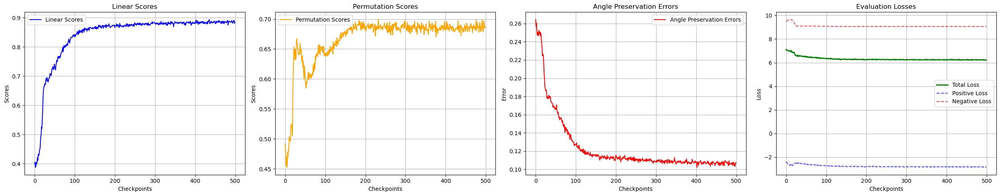

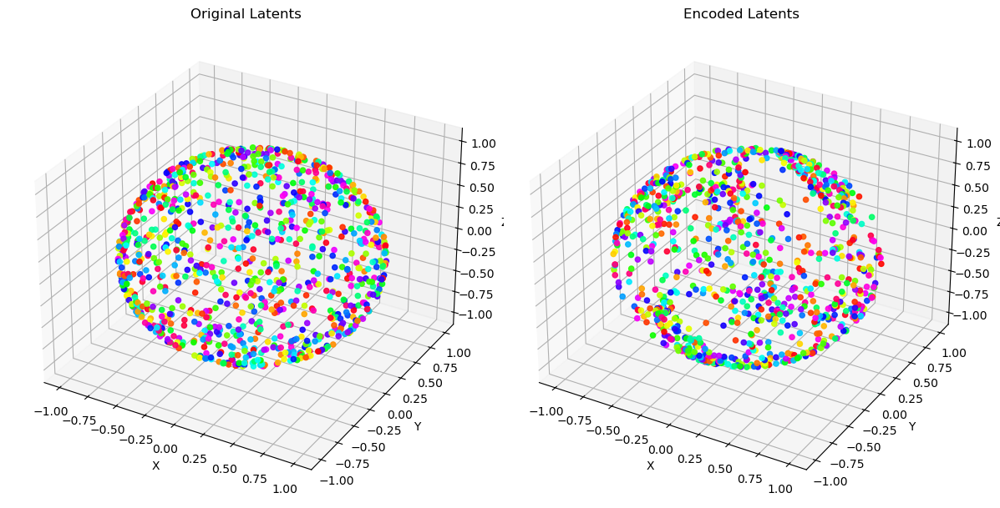

Orthogonal transformation loss:  6.067422389984131
Training loss:  6.229270935058594


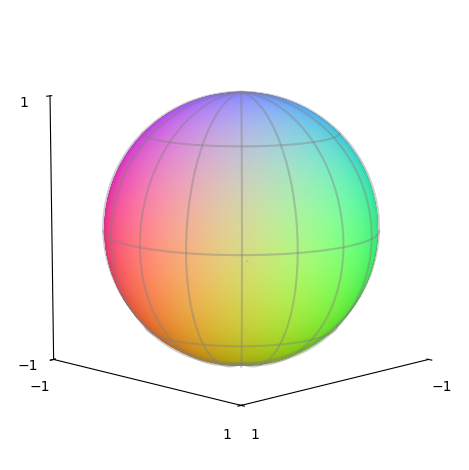

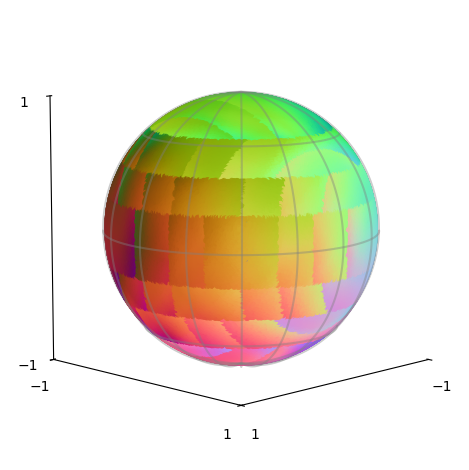

In [20]:
from encoders import InversePatchesEncoder
from data.generation import Patches

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

g_patches = Patches(4, device)
f_patches = InversePatchesEncoder(3, 3, 4).to(device)  # Move to device

f_patches, scores = SimCLRExecutor(
    f_patches, g_patches, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Experiment with the invertible MLP as a data generating process

condition number threshold: 1.041329
layer 1/3,  condition number: 1.0309417053676986
layer 2/3,  condition number: 1.0350157525003478
layer 3/3,  condition number: 1.0296010699579163


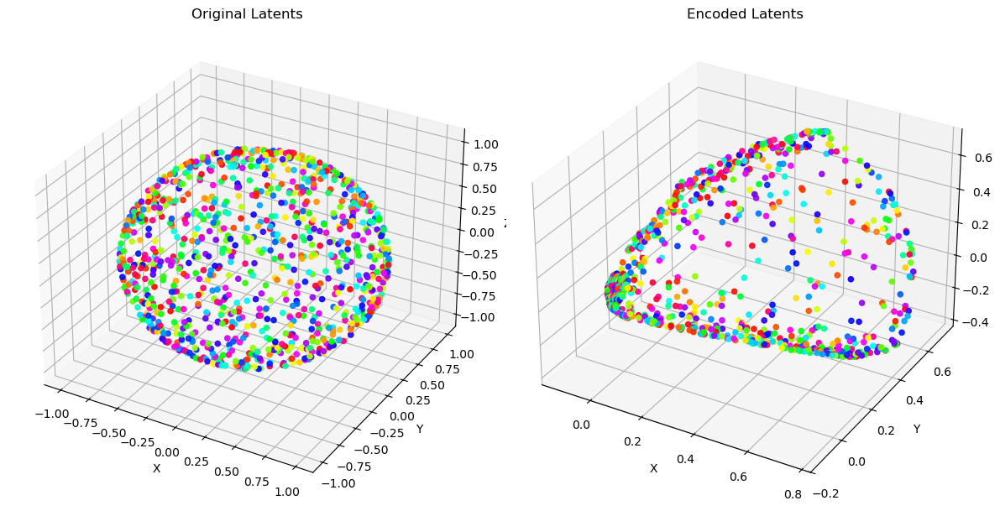

In [21]:
from invertible_network_utils import construct_invertible_mlp

g_mlp = construct_invertible_mlp(
        n=3,
        n_layers=3,
        act_fct='leaky_relu',
        cond_thresh_ratio=0.0,
        n_iter_cond_thresh=25000,
).to(device)

z = full_sphere.uniform(1000).to(device)

visualize_spheres_side_by_side(plt, z.cpu(), g_mlp(z).cpu())

Linear control score: 1.0
Permutation control score: 1.0
Loss: 6.746255874633789 Pos Loss: -2.40474534034729 Neg Loss: 9.151000022888184 Samples processed: 1 linear disentanglement: 0.3690248429775238 permutation disentanglement: 0.4190799107243468 angle_preservation_error: 0.252625048160553
Loss: 6.028371334075928 Pos Loss: -3.0612215995788574 Neg Loss: 9.089591979980469 Samples processed: 21 linear disentanglement: 0.564569354057312 permutation disentanglement: 0.5728313928679999 angle_preservation_error: 0.21854335069656372
Loss: 5.94368839263916 Pos Loss: -3.1284992694854736 Neg Loss: 9.072187423706055 Samples processed: 41 linear disentanglement: 0.48349133133888245 permutation disentanglement: 0.5286255621717828 angle_preservation_error: 0.23259317874908447
Loss: 5.88011360168457 Pos Loss: -3.1931450366973877 Neg Loss: 9.073259353637695 Samples processed: 61 linear disentanglement: 0.3925299644470215 permutation disentanglement: 0.41149311215515677 angle_preservation_error: 0.256

Loss: 5.790469169616699 Pos Loss: -3.2638609409332275 Neg Loss: 9.054330825805664 Samples processed: 241 linear disentanglement: 0.32382336258888245 permutation disentanglement: 0.27987452679639035 angle_preservation_error: 0.2641738951206207
Loss: 5.779736042022705 Pos Loss: -3.2802767753601074 Neg Loss: 9.060011863708496 Samples processed: 261 linear disentanglement: 0.3218335509300232 permutation disentanglement: 0.2755513859339848 angle_preservation_error: 0.2680330276489258
Loss: 5.774361610412598 Pos Loss: -3.2788515090942383 Neg Loss: 9.053213119506836 Samples processed: 281 linear disentanglement: 0.32634973526000977 permutation disentanglement: 0.30289166960783004 angle_preservation_error: 0.2621544897556305
Loss: 5.774746894836426 Pos Loss: -3.2828633785247803 Neg Loss: 9.057609558105469 Samples processed: 301 linear disentanglement: 0.32533568143844604 permutation disentanglement: 0.2802224088652436 angle_preservation_error: 0.2627134919166565
Loss: 5.7654242515563965 Pos Lo

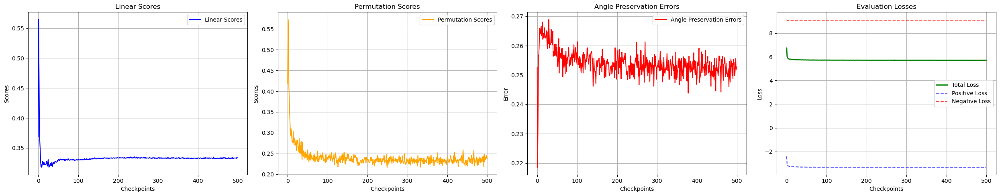

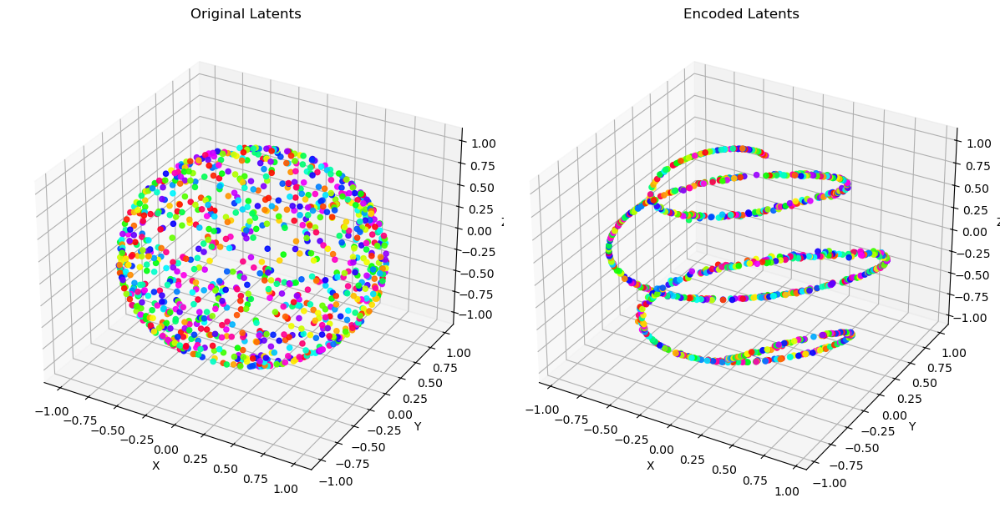

Orthogonal transformation loss:  6.060939788818359
Training loss:  5.711596965789795


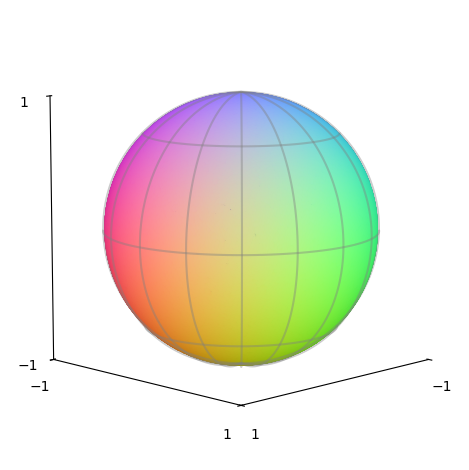

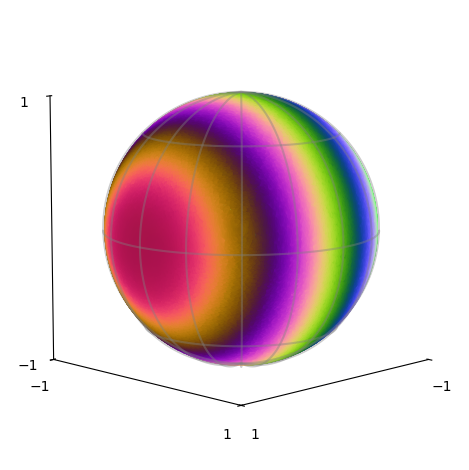

In [24]:
f_mlp = SphericalEncoder(input_dim=3, hidden_dims=[128, 256, 256, 256, 128], output_dim=3).to(device)

f_mlp, scores = SimCLRExecutor(
    f_mlp, g_mlp, sample_pair_fixed, sample_uniform_fixed, tau, device
).execute(batch_size, iterations, plt)

## Next

- Run it with a correct model (Cross-Entropy with a correct normalizer)